In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

Irregular analysis

Case 1 Irregular: When the irregularity is fixed always; so it's very sensitive to the indices you choose

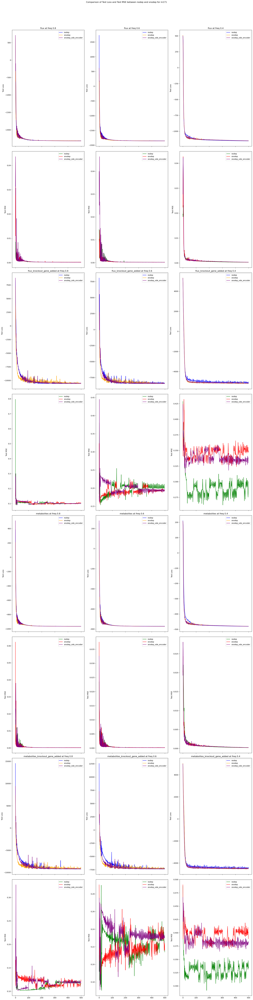

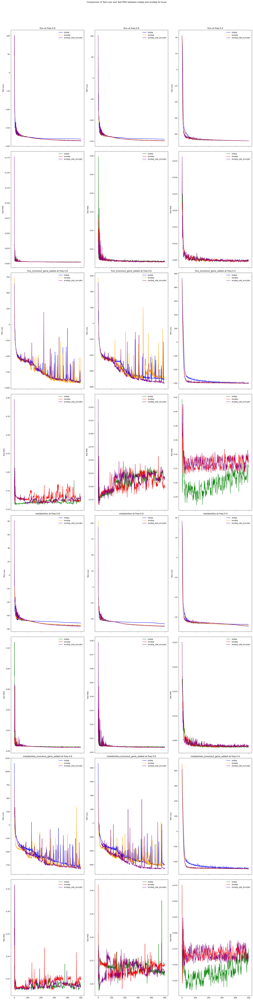

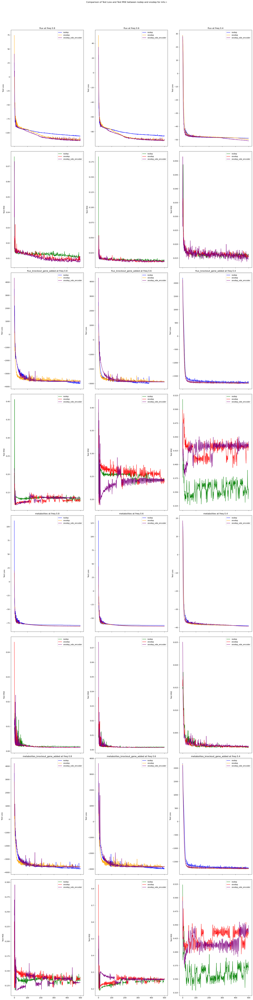

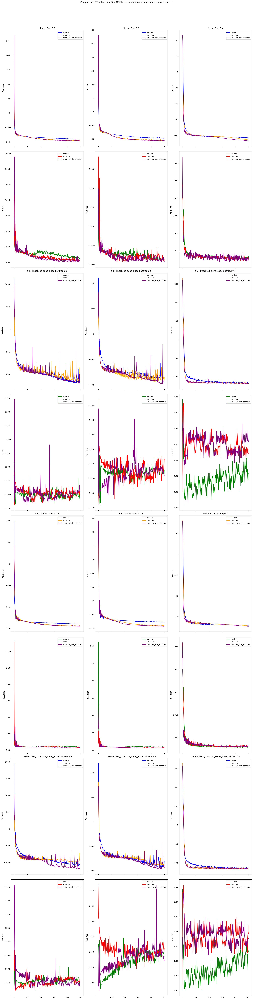

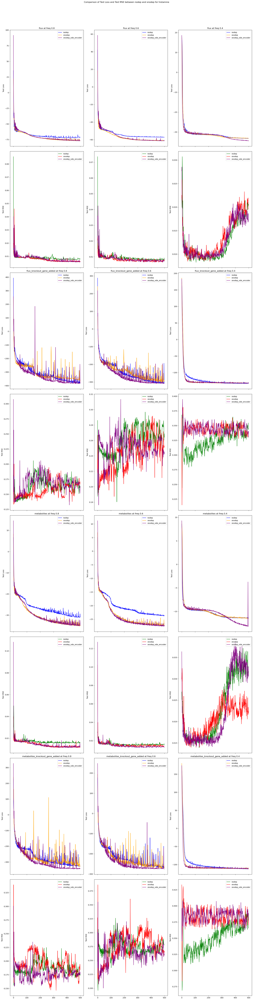

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Define the pathways and cases
pathways = ['m171', 'bcaa', 'mhc-i', 'glucose-tcacycle', 'histamine']

cases = ['flux', 'flux_knockout_gene_added', 'metabolites', 'metabolites_knockout_gene_added']
# cases = ['flux', 'flux_knockout_gene_added']
freqs = [0.8, 0.6, 0.4]

# Function to load data
def load_data(pathway, case, dep_type, freq):
    if case == 'gene_expression':
        base_path = f'./results_new/{pathway}/{case}/{pathway}_geneexpr_{dep_type}_irregular_freq_{freq}'
    else:
        if 'knockout' in case:
            base_path = f'./results_new/{pathway}/{case}/multiple_gene/{pathway}_{case}_{dep_type}_irregular_freq_{freq}'
        else:
            base_path = f'./results_new/{pathway}/{case}/{pathway}_{case}_{dep_type}_irregular_freq_{freq}'
    data = {
        'test_loss': np.load(f'{base_path}/loss_history.npy'),
        'test_mse': np.load(f'{base_path}/test_mse_history.npy')
    }
    return data

# Loop over pathways
for i, pathway in enumerate(pathways):
    # Initialize plots for each pathway
    fig, axes = plt.subplots(len(cases) * 2, len(freqs), figsize=(20, 20 * len(cases)), sharex='col')
    fig.suptitle(f'Comparison of Test Loss and Test MSE between nodep and snodep for {pathway}')
    
    for j, case in enumerate(cases):
        for k, freq in enumerate(freqs):
            data_nodep = load_data(pathway, case, 'nodep', freq)
            data_snodep = load_data(pathway, case, 'snodep', freq)
            data_snodep_ode_encoder = load_data(pathway, case, 'snodep_ode_encoder', freq)
            
            # # Plot Test Loss
            axes[j * 2, k].plot(data_nodep['test_loss'], label='nodep', color='b')
            axes[j * 2, k].plot(data_snodep['test_loss'], label='snodep', color='orange')
            axes[j * 2, k].plot(data_snodep_ode_encoder['test_loss'], label='snodep_ode_encoder', color='purple')
            axes[j * 2, k].set_title(f'{case} at freq {freq}')
            axes[j * 2, k].set_ylabel('Test Loss')
            axes[j * 2, k].legend(loc='upper right')
            
            # Plot Test MSE
            axes[j * 2 + 1, k].plot(data_nodep['test_mse'], label='nodep', color='g')
            axes[j * 2 + 1, k].plot(data_snodep['test_mse'], label='snodep', color='r')
            axes[j * 2 + 1, k].plot(data_snodep_ode_encoder['test_mse'], label='snodep_ode_encoder', color='purple')
            axes[j * 2 + 1, k].set_ylabel('Test MSE')
            axes[j * 2 + 1, k].legend(loc='upper right')
    
    # Adjust layout and show the figure
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

Case 2 Irregular: When the irregularity is random;;; but but but, our mse was not masked; so it's not a good comparison; hence I have a irregular3

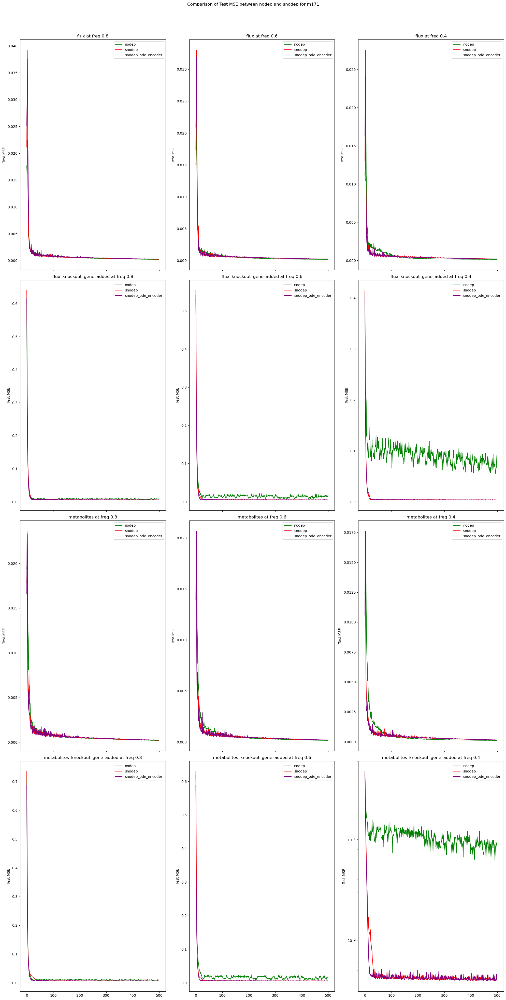

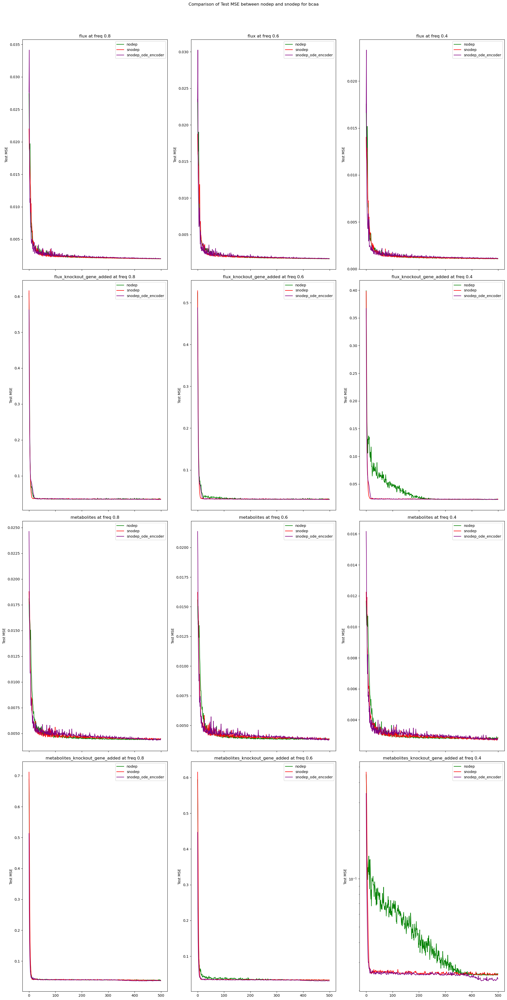

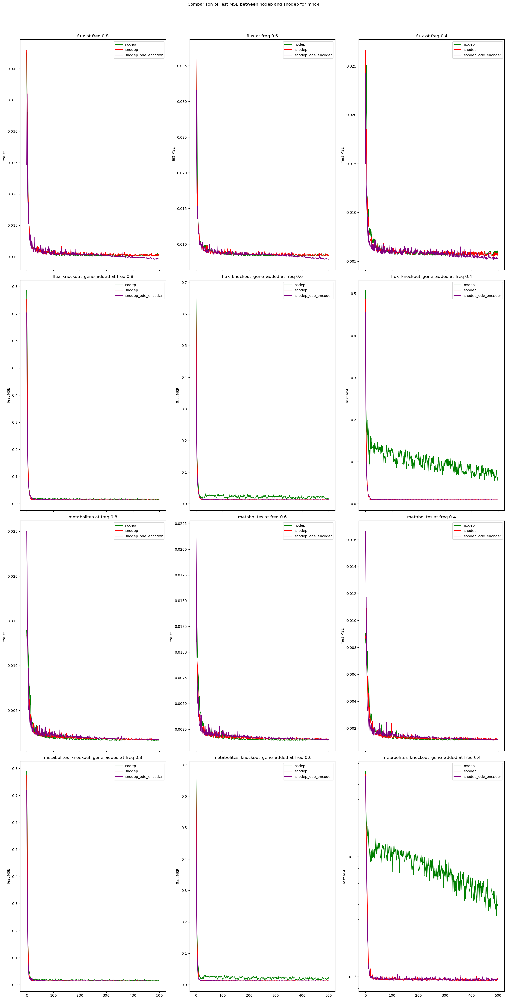

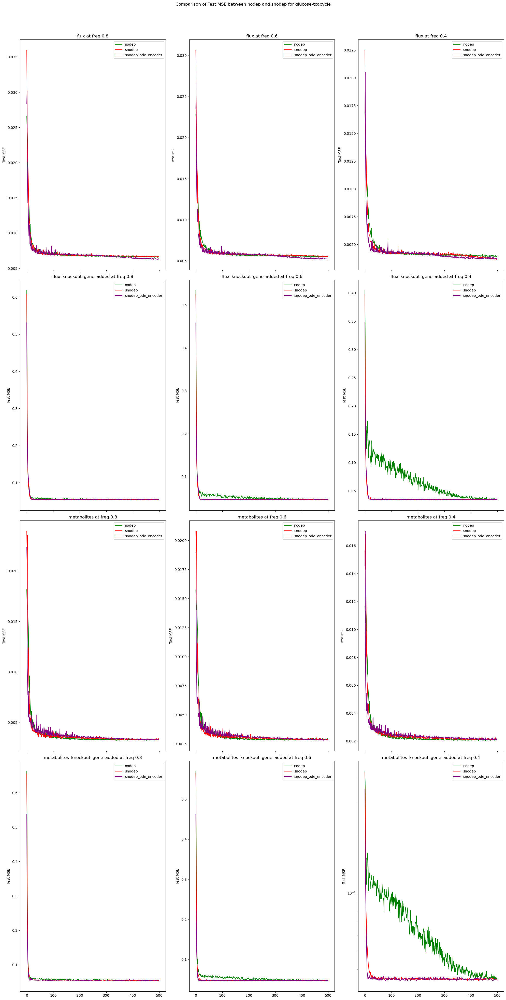

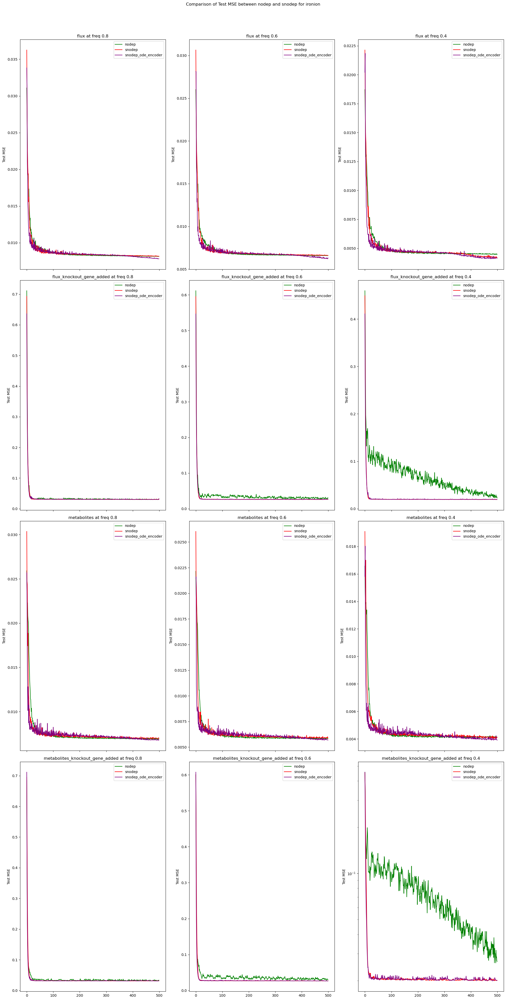

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Define the pathways and cases
pathways = ['m171', 'bcaa', 'mhc-i', 'glucose-tcacycle', 'ironion']
# pathways = ['ironion']
# pathways = ['m171', 'bcaa', 'mhc-i', 'glucose-tcacycle']

cases = ['flux', 'flux_knockout_gene_added', 'metabolites', 'metabolites_knockout_gene_added']
# cases = ['flux_knockout_gene_added']
# cases =['flux']
# freqs = [0.8, 0.6, 0.4]


# for case 3 only
# pathways = ['m171', 'bcaa']
# cases = ['metabolites_knockout_gene_added', 'metabolites']

freqs = [0.8, 0.6, 0.4]
# Function to load data
def load_data(pathway, case, dep_type, freq):
    if case == 'gene_expression':
        base_path = f'./results_new/{pathway}/{case}/{pathway}_geneexpr_{dep_type}_irregular3_freq_{freq}'
    else:
        if 'knockout' in case:
            base_path = f'./results_new/{pathway}/{case}/multiple_gene/{pathway}_{case}_{dep_type}_irregular3_freq_{freq}'
        else:
            base_path = f'./results_new/{pathway}/{case}/{pathway}_{case}_{dep_type}_irregular3_freq_{freq}'
    data = {
        'test_loss': np.load(f'{base_path}/loss_history.npy'),
        'test_mse': np.load(f'{base_path}/test_mse_history.npy')
    }
    return data

def give_plot(pathways, cases, freqs, metric='test_mse', log_scale=False, save_fig=False):
    # Loop over pathways
    for i, pathway in enumerate(pathways):
        # Initialize plots for each pathway
        fig, axes = plt.subplots(len(cases), len(freqs), figsize=(20, 10 * len(cases)), sharex='col')
        fig.suptitle(f'Comparison of Test MSE between nodep and snodep for {pathway}')
        
        for j, case in enumerate(cases):
            for k, freq in enumerate(freqs):
                data_nodep = load_data(pathway, case, 'nodep', freq)
                data_snodep = load_data(pathway, case, 'snodep', freq)
                data_snodep_ode_encoder = load_data(pathway, case, 'snodep_ode_encoder', freq)
                
                # Plot Test MSE
                axes[j, k].plot(data_nodep[metric], label='nodep', color='g')
                axes[j, k].plot(data_snodep[metric], label='snodep', color='r')
                axes[j, k].plot(data_snodep_ode_encoder[metric], label='snodep_ode_encoder', color='purple')
                axes[j, k].set_title(f'{case} at freq {freq}')
                axes[j, k].set_ylabel('Test MSE')
                axes[j, k].legend(loc='upper right')
            
        # Adjust layout and show the figure
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        if save_fig:
            fig.savefig(f'./paper_figures/in_progress/{metric}_comparison_irregular3_{pathway}.png')
        if log_scale:
            plt.yscale('log')
        plt.show()

give_plot(pathways, cases, freqs, metric='test_mse', log_scale=True)

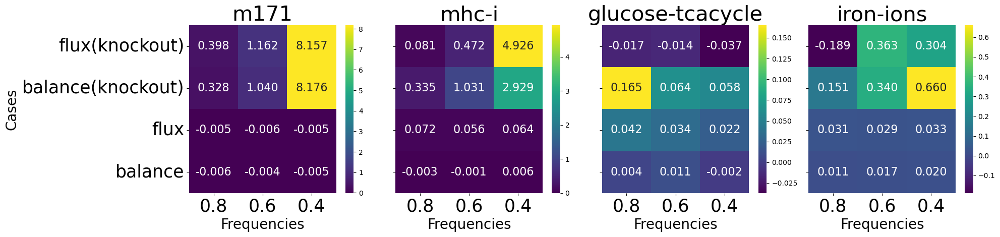

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Define the pathways, cases, frequencies, and models
# pathways = ['m171', 'bcaa', 'mhc-i', 'glucose-tcacycle', 'ironion']
pathways = ['m171', 'mhc-i', 'glucose-tcacycle', 'ironion']

cases = ['flux_knockout_gene_added', 'metabolites_knockout_gene_added', 'flux', 'metabolites']
# cases = ['flux_knockout_gene_added', 'metabolites_knockout_gene_added']
# cases= ['flux', 'metabolites']
# cases = ['metabolites']
freqs = [0.8, 0.6, 0.4]
# freqs = [0.4]
# models = ['nodep', 'snodep', 'snodep_ode_encoder']
models = ['nodep', 'snodep_ode_encoder']

# Function to load data
def load_data(pathway, case, dep_type, freq):
    if case == 'gene_expression':
        base_path = f'./results_new/{pathway}/{case}/{pathway}_geneexpr_{dep_type}_irregular3_freq_{freq}'
    else:
        if 'knockout' in case:
            base_path = f'./results_new/{pathway}/{case}/multiple_gene/{pathway}_{case}_{dep_type}_irregular3_freq_{freq}'
        else:
            base_path = f'./results_new/{pathway}/{case}/{pathway}_{case}_{dep_type}_irregular3_freq_{freq}'
    data = {
        'test_loss': np.load(f'{base_path}/loss_history.npy'),
        'test_mse': np.load(f'{base_path}/test_mse_history.npy')
    }
    return data

# Initialize a dictionary to store the results
results = {}

# Loop over pathways, cases, and frequencies to collect the results
for pathway in pathways:
    results[pathway] = {}
    for case in cases:
        results[pathway][case] = {}
        for freq in freqs:
            results[pathway][case][freq] = {}
            for model in models:
                data = load_data(pathway, case, model, freq)
                results[pathway][case][freq][model] = data['test_mse'][-1]

# Convert the results dictionary to a pandas DataFrame
rows = []
for pathway in pathways:
    for case in cases:
        for freq in freqs:
            row = {'Pathway': pathway, 'Case': case, 'Frequency': freq}
            for model in models:
                row[f'{model}_test_mse'] = results[pathway][case][freq][model]
            rows.append(row)

df = pd.DataFrame(rows)

# Function to highlight the maximum value in each row
def highlight_min(s):
    is_min = s == s.min()
    return ['background-color: yellow' if v else '' for v in is_min]

# Apply the highlight function to the DataFrame
styled_df = df.style.apply(highlight_min, subset=[f'{model}_test_mse' for model in models], axis=1)

# Display the styled DataFrame
styled_df

# Create a heatmap for each pathway
for pathway in pathways:
    heatmap_data = np.zeros((len(cases), len(freqs)))
    for i, case in enumerate(cases):
        for j, freq in enumerate(freqs):
            mse_values = [results[pathway][case][freq][model] for model in models]
            min_model_index = np.argmin(mse_values)
            # heatmap_data[i, j] = min_model_index
            # heatmap_data[i, j] = max(mse_values[0]-mse_values[2], mse_values[0]-mse_values[1])
            heatmap_data[i, j] = mse_values[0]-mse_values[1]

    # # Create a DataFrame for the heatmap
    # heatmap_df = pd.DataFrame(heatmap_data, index=cases, columns=freqs)
    
    # # Plot the heatmap
    # plt.figure(figsize=(10, 6))
    # cmap = sns.color_palette("viridis", 3)
    # sns.heatmap(heatmap_df, annot=True, cmap=cmap, cbar=False, 
    #             xticklabels=freqs, yticklabels=cases, 
    #             annot_kws={"size": 16}, fmt='.0f')
    # plt.title(f'Heatmap of Best Model for {pathway}')
    # plt.xlabel('Frequencies')
    # plt.ylabel('Cases')
    
    # # Add a custom legend
    # legend_labels = {
    #     0: 'NODEP',
    #     1: 'SNODEP',
    #     2: 'SNODEP+GRU_ODE'
    # }
    # handles = [Patch(color=cmap[i], label=legend_labels[i]) for i in legend_labels]
    # plt.legend(handles=handles, title='Models', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # plt.show()

    # # Create a DataFrame for the heatmap
    # heatmap_df = pd.DataFrame(heatmap_data, index=cases, columns=freqs)
    
    # # Plot the heatmap
    # plt.figure(figsize=(5, 3))
    # cmap = sns.color_palette("viridis", as_cmap=True)
    # sns.heatmap(heatmap_df, annot=True, cmap=cmap, cbar=True, 
    #             xticklabels=freqs, yticklabels=cases, 
    #             annot_kws={"size": 16}, fmt='.5f')
    # plt.title(f'Heatmap of Max MSE Difference for {pathway}')
    # plt.xlabel('Frequencies')
    # plt.ylabel('Cases')

    # plt.show()

    # Initialize a figure with subplots

def modify_cases(cases):
    # Replace case names
    cases = [case.replace('flux_knockout_gene_added', 'flux(knockout)').replace('metabolites_knockout_gene_added', 'balance(knockout)').replace('metabolites', 'balance') for case in cases]
    return cases

def get_heatmap(pathways, cases, freqs, models, all_together=False, save_fig=False):

    if all_together:
        fig, axes = plt.subplots(1, len(pathways), figsize=(5 * len(pathways), 5), sharey=True)

        # Loop over pathways to create heatmaps
        for idx, pathway in enumerate(pathways):
            heatmap_data = np.zeros((len(cases), len(freqs)))
            for i, case in enumerate(cases):
                for j, freq in enumerate(freqs):
                    mse_values = [results[pathway][case][freq][model] for model in models]
                    min_model_index = np.argmin(mse_values)
                    # heatmap_data[i, j] = max(mse_values[0]-mse_values[2], mse_values[0]-mse_values[1])
                    heatmap_data[i, j] = mse_values[0]-mse_values[1]

            # Create a DataFrame for the heatmap
            heatmap_df = pd.DataFrame(heatmap_data, index=modify_cases(cases), columns=freqs)
            
            # Plot the heatmap on the corresponding subplot
            sns.heatmap(heatmap_df * 100, annot=True, cmap="viridis", cbar=True, 
                        xticklabels=freqs, yticklabels=modify_cases(cases), 
                        annot_kws={"size": 16}, fmt='.3f', ax=axes[idx])
            if pathway == 'ironion':
                pathway= 'iron-ions'
                axes[idx].set_title(f'{pathway}', fontsize=30)
            else:
                axes[idx].set_title(f'{pathway}', fontsize=30)
            axes[idx].set_xlabel('Frequencies', fontsize=20)
            axes[idx].tick_params(axis='both', which='major', labelsize=25)
            if idx == 0:
                axes[idx].set_ylabel('Cases', fontsize=20)

        # Add a common title for the factor
        # fig.suptitle(r'Heatmap of Max MSE Difference (x $10^{-2}$)', y=1.05)
        # Adjust layout and show the figure
        if save_fig:
            plt.savefig(f'./paper_figures/updated/heatmap/heatmap_all_together.png')
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()
    else:
        # Loop over pathways to create heatmaps
        for idx, pathway in enumerate(pathways):
            heatmap_data = np.zeros((len(cases), len(freqs)))
            fig, axes = plt.subplots(1, 1, figsize=(5, 3))
            for i, case in enumerate(cases):
                for j, freq in enumerate(freqs):
                    mse_values = [results[pathway][case][freq][model] for model in models]
                    min_model_index = np.argmin(mse_values)
                    # heatmap_data[i, j] = max(mse_values[0]-mse_values[2], mse_values[0]-mse_values[1])
                    heatmap_data[i, j] = (mse_values[0]-mse_values[1])

            # Create a DataFrame for the heatmap
            heatmap_df = pd.DataFrame(heatmap_data, index=modify_cases(cases), columns=freqs)
            
            # Plot the heatmap on the corresponding subplot
            sns.heatmap(heatmap_df * 100, annot=True, cmap="viridis", cbar=True, 
                        xticklabels=freqs, yticklabels=modify_cases(cases), 
                        annot_kws={"size": 16}, fmt='.3f', ax=axes)
            axes.set_title(f'{pathway}', fontsize=40)
            axes.set_xlabel('Frequencies', fontsize=40)
            axes.set_ylabel('Cases')

            # Add a common title for the factor
            # fig.suptitle(r'Heatmap of Max MSE Difference (x $10^{-2}$)', y=1.05)
            # Adjust layout and show the figure
            if save_fig:
                plt.savefig(f'./paper_figures/updated/heatmap/heatmap_{pathway}.png')
            plt.tight_layout()
            plt.show()
        

get_heatmap(pathways, cases, freqs, models, all_together=True, save_fig=True)

In [47]:
# styled_df
# Multiply the values in the DataFrame by 100

df_multiplied = df.copy()
df_multiplied.update(df_multiplied.iloc[:, 3:] * 100)

# Round the values to the 4th decimal place
df_multiplied = df_multiplied.round(4)

# Add a new column 'delta' which is the difference between the two models' test MSE values
df_multiplied['delta'] = df_multiplied[f'{models[0]}_test_mse'] - df_multiplied[f'{models[1]}_test_mse']

# Apply the highlight function to the modified DataFrame
styled_df_multiplied = df_multiplied.style.apply(
    highlight_min, 
    subset=[f'{model}_test_mse' for model in models], 
    axis=1
)

# Display the styled DataFrame
styled_df_multiplied

,Pathway,Case,Frequency,nodep_test_mse,snodep_ode_encoder_test_mse,delta
0,m171,flux_knockout_gene_added,0.800000,0.943400,0.545100,0.398300
1,m171,flux_knockout_gene_added,0.600000,1.636500,0.474300,1.162200
2,m171,flux_knockout_gene_added,0.400000,8.531800,0.374500,8.157300
3,m171,metabolites_knockout_gene_added,0.800000,0.945200,0.617400,0.327800
4,m171,metabolites_knockout_gene_added,0.600000,1.579400,0.539700,1.039700
5,m171,metabolites_knockout_gene_added,0.400000,8.574700,0.398500,8.176200
6,m171,flux,0.800000,0.023200,0.028500,-0.005300
7,m171,flux,0.600000,0.018500,0.024500,-0.006000
8,m171,flux,0.400000,0.013800,0.018800,-0.005000
9,m171,metabolites,0.800000,0.019600,0.025500,-0.005900


In [49]:
# latex_table = styled_df_multiplied.to_latex()

# # Display the LaTeX table
# print(latex_table)

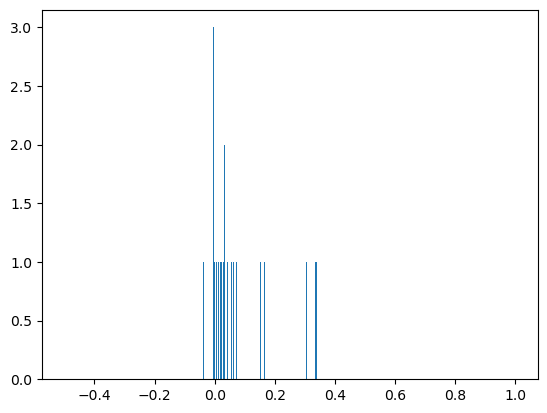

In [56]:
# plt.hist(df_multiplied['delta'], bins=1000, range=(-0.5, 1))
# plt.show()


Convert to latex; doesn't work exactly as required

In [76]:
# Reshape the DataFrame
reshaped_rows = []
for pathway in pathways:
    for model in models:
        row = {'Pathway': pathway, 'Model': model}
        for case in cases:
            for freq in freqs:
                col_name = f'{case}_{freq}'
                row[col_name] = results[pathway][case][freq][model]  # Use the last value of test_mse
        reshaped_rows.append(row)

reshaped_df = pd.DataFrame(reshaped_rows)

# Generate the LaTeX table
latex_table = reshaped_df.to_latex(index=False, float_format="%.7f")

# Display the LaTeX table
print(latex_table)

\begin{tabular}{llrrrrrr}
\toprule
Pathway & Model & flux_0.8 & flux_0.6 & flux_0.4 & metabolites_0.8 & metabolites_0.6 & metabolites_0.4 \\
\midrule
m171 & nodep & 0.0002316 & 0.0001850 & 0.0001379 & 0.0001959 & 0.0001635 & 0.0001126 \\
m171 & snodep & 0.0002703 & 0.0002309 & 0.0001941 & 0.0002162 & 0.0001874 & 0.0001525 \\
m171 & snodep_ode_encoder & 0.0002851 & 0.0002451 & 0.0001884 & 0.0002546 & 0.0002020 & 0.0001599 \\
bcaa & nodep & 0.0019787 & 0.0016807 & 0.0010802 & 0.0044812 & 0.0038635 & 0.0028748 \\
bcaa & snodep & 0.0020039 & 0.0017008 & 0.0010951 & 0.0045052 & 0.0038651 & 0.0028360 \\
bcaa & snodep_ode_encoder & 0.0020172 & 0.0017254 & 0.0011378 & 0.0044072 & 0.0037982 & 0.0027682 \\
mhc-i & nodep & 0.0103317 & 0.0084381 & 0.0059043 & 0.0016970 & 0.0014839 & 0.0011792 \\
mhc-i & snodep & 0.0101978 & 0.0084139 & 0.0056666 & 0.0017714 & 0.0015479 & 0.0011736 \\
mhc-i & snodep_ode_encoder & 0.0096092 & 0.0078810 & 0.0052623 & 0.0017224 & 0.0014940 & 0.0011230 \\
glucose-tcacy

Synthetic data

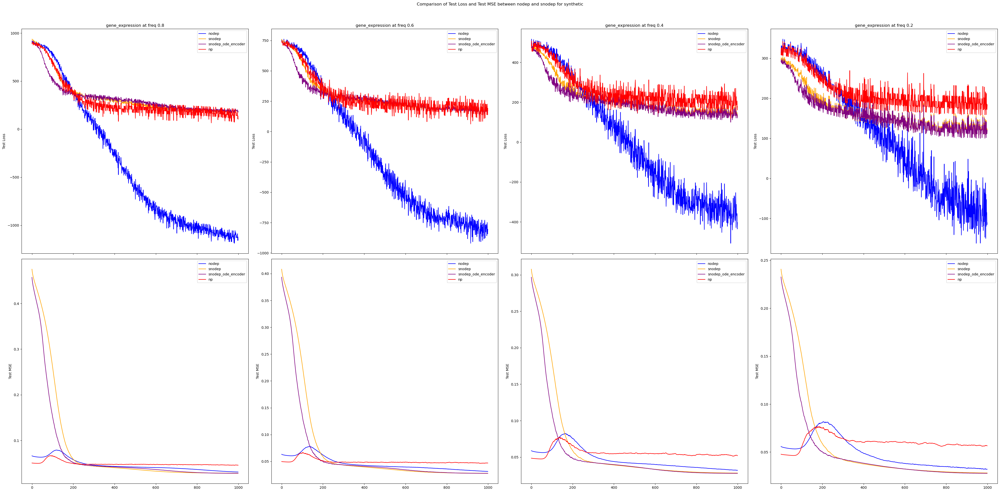

In [74]:
import numpy as np
import matplotlib.pyplot as plt

# Define the pathways and cases
# pathways = ['m171', 'bcaa', 'mhc-i', 'glucose-tcacycle', 'histamine']
pathways = ['synthetic']
# cases = ['flux', 'flux_knockout_gene_added', 'metabolites', 'metabolites_knockout_gene_added']
# cases = ['flux', 'flux_knockout_gene_added']
cases = ['gene_expression']
freqs = [0.8, 0.6, 0.4, 0.2]

# Function to load data
def load_data(pathway, case, dep_type, freq):
    if freq == 1:
        if case == 'gene_expression':
            base_path = f'./results_new/{pathway}/{case}/{pathway}_geneexpr_{dep_type}'
        else:
            if 'knockout' in case:
                base_path = f'./results_new/{pathway}/{case}/multiple_gene/{pathway}_{case}_{dep_type}'
            else:
                base_path = f'./results_new/{pathway}/{case}/{pathway}_{case}_{dep_type}'
    else:
        if case == 'gene_expression':
            base_path = f'./results_new/{pathway}/{case}/{pathway}_geneexpr_{dep_type}_irregular_{freq}'
        else:
            if 'knockout' in case:
                base_path = f'./results_new/{pathway}/{case}/multiple_gene/{pathway}_{case}_{dep_type}_irregular_freq_{freq}'
            else:
                base_path = f'./results_new/{pathway}/{case}/{pathway}_{case}_{dep_type}_irregular_freq_{freq}'
    data = {
        'test_loss': np.load(f'{base_path}/loss_history.npy'),
        'test_mse': np.load(f'{base_path}/test_mse_history.npy')
    }
    return data

# Loop over pathways
for i, pathway in enumerate(pathways):
    # Initialize plots for each pathway
    fig, axes = plt.subplots(len(cases) * 2, len(freqs), figsize=(40, 20), sharex='col')
    axes = np.atleast_2d(axes)  # Ensure axes is always a 2D array
    fig.suptitle(f'Comparison of Test Loss and Test MSE between nodep and snodep for {pathway}')
    # import pdb; pdb.set_trace()
    for j, case in enumerate(cases):
        for k, freq in enumerate(freqs):
            data_nodep = load_data(pathway, case, 'nodep', freq)
            data_snodep = load_data(pathway, case, 'snodep', freq)
            data_snodep_ode_encoder = load_data(pathway, case, 'snodep_ode_encoder', freq)
            data_np = load_data(pathway, case, 'np', freq)
            
            # Plot Test Loss
            axes[2*j, k].plot(data_nodep['test_loss'], label='nodep', color='b')
            axes[2*j, k].plot(data_snodep['test_loss'], label='snodep', color='orange')
            axes[2*j, k].plot(data_snodep_ode_encoder['test_loss'], label='snodep_ode_encoder', color='purple')
            axes[2*j, k].plot(data_np['test_loss'], label='np', color='r')
            axes[2*j, k].set_title(f'{case} at freq {freq}')
            axes[2*j, k].set_ylabel('Test Loss')
            axes[2*j, k].legend(loc='upper right')
            # import pdb; pdb.set_trace()
            # Plot Test MSE
            axes[2*j+1, k].plot(data_nodep['test_mse'], label='nodep', color='b')
            axes[2*j+1, k].plot(data_snodep['test_mse'], label='snodep', color='orange')
            axes[2*j+1, k].plot(data_snodep_ode_encoder['test_mse'], label='snodep_ode_encoder', color='purple')
            axes[2*j+1, k].plot(data_np['test_mse'], label='np', color='r')
            axes[2*j+1, k].set_ylabel('Test MSE')
            axes[2*j+1, k].legend(loc='upper right')
    
    # Adjust layout and show the figure
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

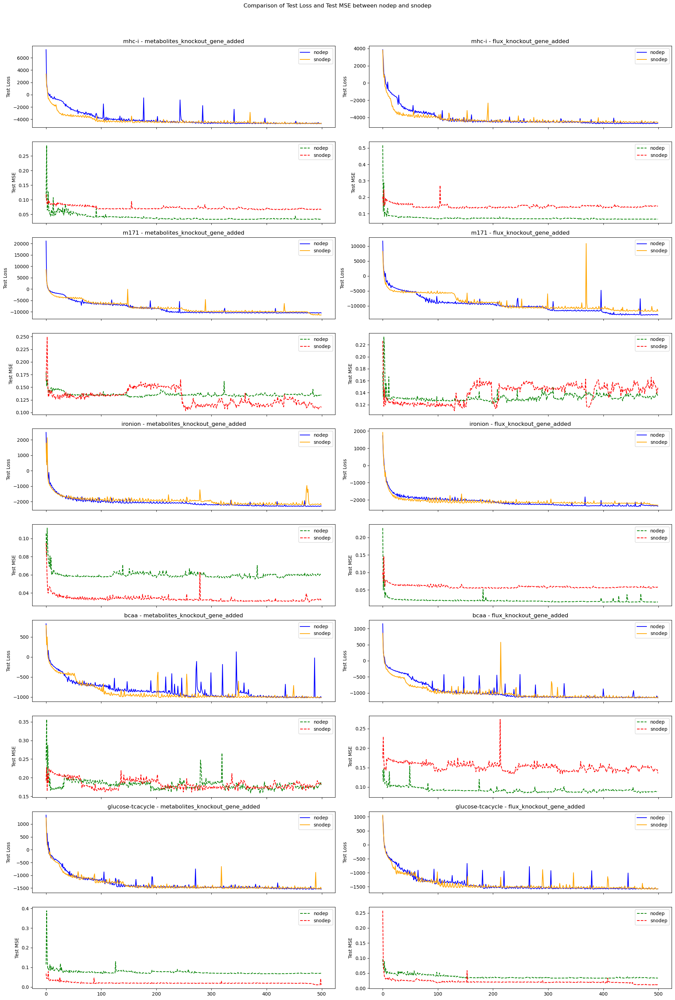

In [5]:
# import numpy as np
# import matplotlib.pyplot as plt

# # Define the pathways and cases
# # do again: histamine, serotonin
# pathways = ['mhc-i', 'm171', 'ironion', 'bcaa', 'glucose-tcacycle']
# # cases = ['gene_expression', 'flux', 'metabolites', 'metabolites_knockout_gene_added', 'flux_knockout_gene_added']
# cases = ['metabolites_knockout_gene_added', 'flux_knockout_gene_added']

# # Function to load data
# def load_data(pathway, case, dep_type):
#     if case=='metabolites_knockout_gene_added':
#         case2= 'metabolites_reaction_knockout_gene_added'
#     else:
#         case2= 'flux_reaction_knockout_gene_added'
#     if case == 'gene_expression':
#         base_path = f'./results/2d/{pathway}/{case}/ndp/{pathway}_geneexpr_{dep_type}'
#     else:
#         base_path = f'./results/2d/{pathway}/{case}/reaction_knockout/ndp/{pathway}_{case2}_{dep_type}'
#     data = {
#         'test_loss': np.load(f'{base_path}/loss_history.npy'),
#         'test_mse': np.load(f'{base_path}/test_mse_history.npy')
#     }
#     return data

# # Initialize plots
# fig, axes = plt.subplots(len(pathways) * 2, len(cases), figsize=(20, 30), sharex='col')
# fig.suptitle('Comparison of Test Loss and Test MSE between nodep and snodep')

# # Loop over pathways and cases
# for i, pathway in enumerate(pathways):
#     for j, case in enumerate(cases):
#         data_nodep = load_data(pathway, case, 'nodep')
#         data_snodep = load_data(pathway, case, 'snodep')
        
#         # Plot Test Loss
#         axes[i * 2, j].plot(data_nodep['test_loss'], label='nodep', color='b')
#         axes[i * 2, j].plot(data_snodep['test_loss'], label='snodep', color='orange')
#         axes[i * 2, j].set_title(f'{pathway} - {case}')
#         axes[i * 2, j].set_ylabel('Test Loss')
#         axes[i * 2, j].legend(loc='upper right')
        
#         # Plot Test MSE
#         axes[i * 2 + 1, j].plot(data_nodep['test_mse'], label='nodep', color='g', linestyle='dashed')
#         axes[i * 2 + 1, j].plot(data_snodep['test_mse'], label='snodep', color='r', linestyle='dashed')
#         axes[i * 2 + 1, j].set_ylabel('Test MSE')
#         axes[i * 2 + 1, j].legend(loc='upper right')
        

# # Adjust layout
# plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.show()

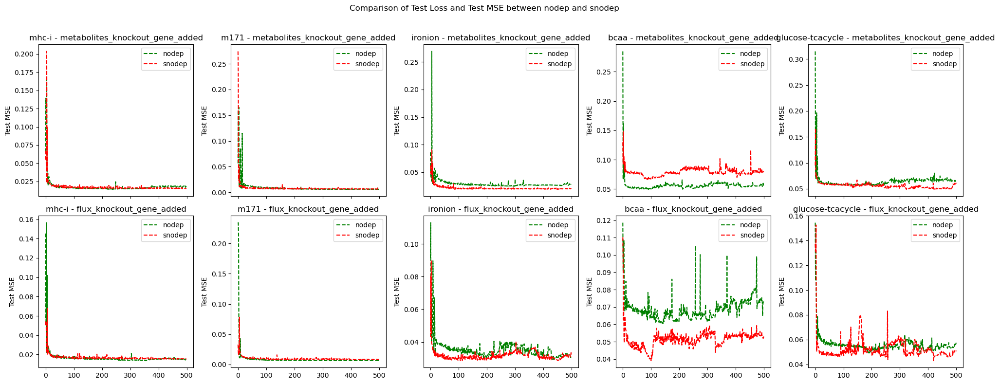

In [3]:
# import numpy as np
# import matplotlib.pyplot as plt

# # Define the pathways and cases
# # do again: histamine, serotonin
# pathways = ['mhc-i', 'm171', 'ironion', 'bcaa', 'glucose-tcacycle']
# # pathways = ['mhc-i', 'ironion', 'bcaa', 'glucose-tcacycle']

# # cases = ['gene_expression', 'flux', 'metabolites', 'metabolites_knockout_gene_added', 'flux_knockout_gene_added']
# cases = ['metabolites_knockout_gene_added', 'flux_knockout_gene_added']


# # names are bit messed up
# # Function to load data
# def load_data(pathway, case, dep_type):
#     if case=='metabolites_knockout_gene_added':
#         case2= 'metabolites_reaction_knockout_gene_added'
#     else:
#         case2= 'flux_reaction_knockout_gene_added'
#     if case == 'gene_expression':
#         base_path = f'./results/2d/{pathway}/{case}/ndp/{pathway}_geneexpr_{dep_type}'
#     else:
#         base_path = f'./results/2d/{pathway}/{case}/multiple_gene/ndp/{pathway}_{case2}_{dep_type}'
#     data = {
#         'test_loss': np.load(f'{base_path}/loss_history.npy'),
#         'test_mse': np.load(f'{base_path}/test_mse_history.npy')
#     }
#     return data

# # # Initialize plots
# # fig, axes = plt.subplots(len(pathways) * 2, len(cases), figsize=(20, 30), sharex='col')
# # fig.suptitle('Comparison of Test Loss and Test MSE between nodep and snodep')

# # # Loop over pathways and cases
# # for i, pathway in enumerate(pathways):
# #     for j, case in enumerate(cases):
# #         data_nodep = load_data(pathway, case, 'nodep')
# #         data_snodep = load_data(pathway, case, 'snodep')
        
# #         # Plot Test Loss
# #         axes[i * 2, j].plot(data_nodep['test_loss'], label='nodep', color='b')
# #         axes[i * 2, j].plot(data_snodep['test_loss'], label='snodep', color='orange')
# #         axes[i * 2, j].set_title(f'{pathway} - {case}')
# #         axes[i * 2, j].set_ylabel('Test Loss')
# #         axes[i * 2, j].legend(loc='upper right')
        
# #         # Plot Test MSE
# #         axes[i * 2 + 1, j].plot(data_nodep['test_mse'], label='nodep', color='g', linestyle='dashed')
# #         axes[i * 2 + 1, j].plot(data_snodep['test_mse'], label='snodep', color='r', linestyle='dashed')
# #         axes[i * 2 + 1, j].set_ylabel('Test MSE')
# #         axes[i * 2 + 1, j].legend(loc='upper right')
        

# # # Adjust layout
# # plt.tight_layout(rect=[0, 0, 1, 0.96])
# # plt.show()

# # Initialize plots
# fig, axes = plt.subplots(len(cases), len(pathways), figsize=(20, 8), sharex='col')
# fig.suptitle('Comparison of Test Loss and Test MSE between nodep and snodep')

# # Loop over pathways and cases
# for i, case in enumerate(cases):
#     for j, pathway in enumerate(pathways):
#         data_nodep = load_data(pathway, case, 'nodep')
#         data_snodep = load_data(pathway, case, 'snodep')
        
#         # Plot Test MSE
#         axes[i , j].plot(data_nodep['test_mse'], label='nodep', color='g', linestyle='dashed')
#         axes[i , j].plot(data_snodep['test_mse'], label='snodep', color='r', linestyle='dashed')
#         axes[i , j].set_title(f'{pathway} - {case}')
#         axes[i , j].set_ylabel('Test MSE')
#         axes[i , j].legend(loc='upper right')
        

# # Adjust layout
# plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.show()


Save the figures

In [19]:
# cases = ['metabolites_knockout_gene_added', 'flux_knockout_gene_added']

# # Loop over cases
# for case in cases:
#     # Initialize plots for each case
#     fig, axes = plt.subplots(1, len(pathways), figsize=(20, 5), sharex='col')
#     fig.suptitle(f'Comparison of Test MSE between nodep and snodep for {case}')
    
#     # Loop over pathways
#     for i, pathway in enumerate(pathways):
#         data_nodep = load_data(pathway, case, 'nodep')
#         data_snodep = load_data(pathway, case, 'snodep')
        
#         # Plot Test MSE
#         axes[i].plot(data_nodep['test_mse'], label='nodep', color='g', linestyle='dashed')
#         axes[i].plot(data_snodep['test_mse'], label='snodep', color='r', linestyle='dashed')
#         axes[i].set_title(f'{pathway}')
#         axes[i].set_ylabel('Test MSE')
#         axes[i].legend(loc='upper right')
    
#     # Adjust layout and save the figure
#     plt.tight_layout(rect=[0, 0, 1, 0.96])
#     plt.savefig(f'test_mse_comparison_{case}.png')
#     plt.close(fig)

Varying context

In [20]:
# # ... existing code ...

# # # For c_2_t_1
# loss_history_2 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_2_t_1/loss_history.npy')
# test_logp_history_2 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_2_t_1/test_logp_history.npy')
# test_mse_history_2 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_2_t_1/test_mse_history.npy')
# test_neg_ll_2 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_2_t_1/test_neg_ll.npy')
# test_kl_2 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_2_t_1/test_kl.npy')
# training_time_2 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_2_t_1/training_time.npy')
# parameter_count_2 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_2_t_1/parameter_count.npy')

# # # For c_3_t_1
# loss_history_3 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_3_t_1/loss_history.npy')
# test_logp_history_3 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_3_t_1/test_logp_history.npy')
# test_mse_history_3 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_3_t_1/test_mse_history.npy')
# test_neg_ll_3 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_3_t_1/test_neg_ll.npy')
# test_kl_3 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_3_t_1/test_kl.npy')
# training_time_3 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_3_t_1/training_time.npy')
# parameter_count_3 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_3_t_1/parameter_count.npy')

# # For c_4_t_2
# loss_history_4 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_4_t_2/loss_history.npy')
# test_logp_history_4 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_4_t_2/test_logp_history.npy')
# test_mse_history_4 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_4_t_2/test_mse_history.npy')
# test_neg_ll_4 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_4_t_2/test_neg_ll.npy')
# test_kl_4 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_4_t_2/test_kl.npy')
# training_time_4 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_4_t_2/training_time.npy')
# parameter_count_4 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_4_t_2/parameter_count.npy')

# # For c_5_t_2
# loss_history_5 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_5_t_2/loss_history.npy')
# test_logp_history_5 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_5_t_2/test_logp_history.npy')
# test_mse_history_5 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_5_t_2/test_mse_history.npy')
# test_neg_ll_5 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_5_t_2/test_neg_ll.npy')
# test_kl_5 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_5_t_2/test_kl.npy')
# training_time_5 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_5_t_2/training_time.npy')
# parameter_count_5 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_5_t_2/parameter_count.npy')

# # For c_6_t_3
# loss_history_6 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_6_t_3/loss_history.npy')
# test_logp_history_6 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_6_t_3/test_logp_history.npy')
# test_mse_history_6 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_6_t_3/test_mse_history.npy')
# test_neg_ll_6 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_6_t_3/test_neg_ll.npy')
# test_kl_6 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_6_t_3/test_kl.npy')
# training_time_6 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_6_t_3/training_time.npy')
# parameter_count_6 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_6_t_3/parameter_count.npy')

# # # For c_7_t_3
# loss_history_7 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_7_t_3/loss_history.npy')
# test_logp_history_7 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_7_t_3/test_logp_history.npy')
# test_mse_history_7 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_7_t_3/test_mse_history.npy')
# test_neg_ll_7 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_7_t_3/test_neg_ll.npy')
# test_kl_7 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_7_t_3/test_kl.npy')
# training_time_7 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_7_t_3/training_time.npy')
# parameter_count_7 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_7_t_3/parameter_count.npy')

# # For c_8_t_4
# loss_history_8 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_8_t_4/loss_history.npy')
# test_logp_history_8 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_8_t_4/test_logp_history.npy')
# test_mse_history_8 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_8_t_4/test_mse_history.npy')
# test_neg_ll_8 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_8_t_4/test_neg_ll.npy')
# test_kl_8 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_8_t_4/test_kl.npy')
# training_time_8 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_8_t_4/training_time.npy')
# parameter_count_8 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_8_t_4/parameter_count.npy')

# # For c_9_t_4
# loss_history_9 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_9_t_4/loss_history.npy')
# test_logp_history_9 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_9_t_4/test_logp_history.npy')
# test_mse_history_9 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_9_t_4/test_mse_history.npy')
# test_neg_ll_9 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_9_t_4/test_neg_ll.npy')
# test_kl_9 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_9_t_4/test_kl.npy')
# training_time_9 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_9_t_4/training_time.npy')
# parameter_count_9 = np.load('./results/2d/m171/gene_expression/single_gene/ndp/m171_geneexpr_snodep_c_9_t_4/parameter_count.npy')

# # ... existing code ...

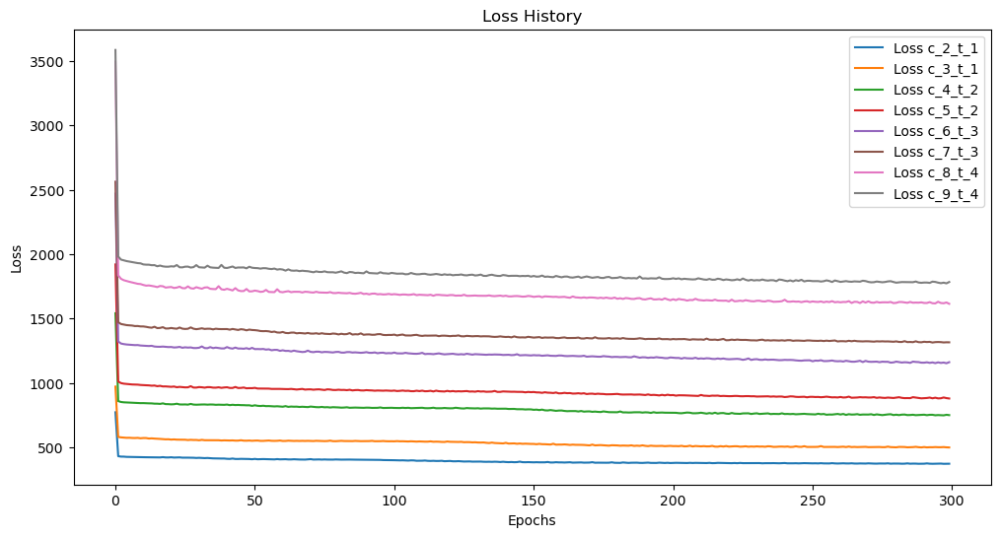

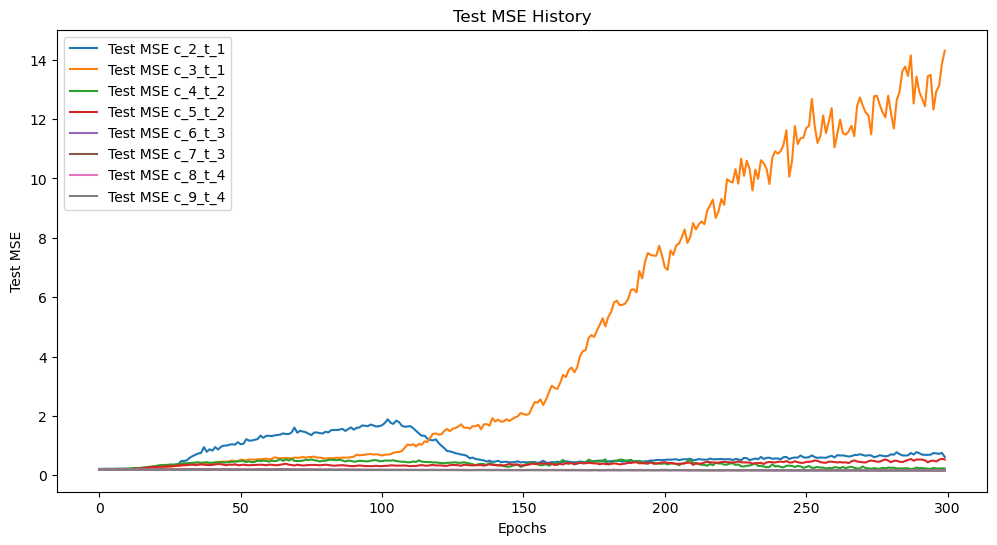

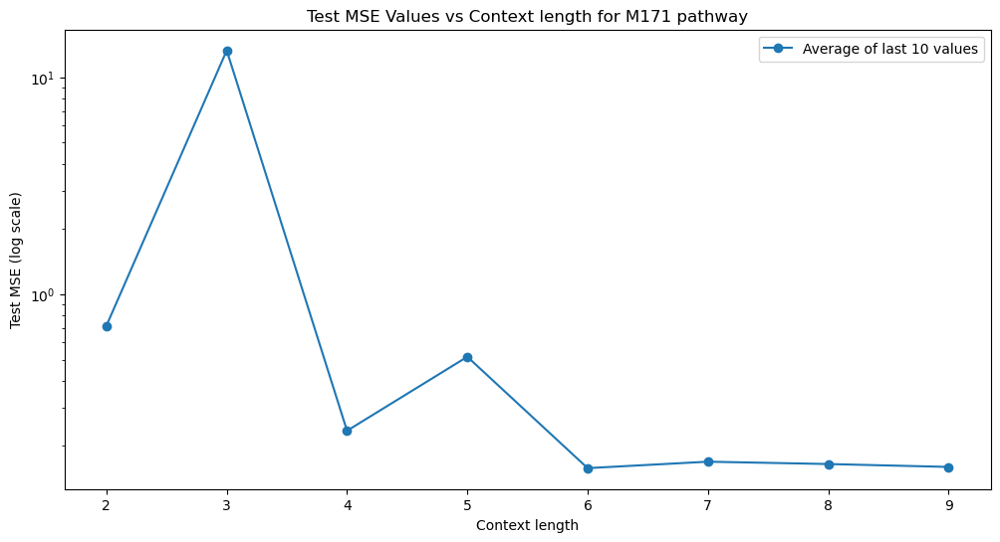

In [31]:
# # Plotting loss history for all cases
# plt.figure(figsize=(12, 6))

# plt.plot(loss_history_2[:300], label='Loss c_2_t_1')
# plt.plot(loss_history_3[:300], label='Loss c_3_t_1')
# plt.plot(loss_history_4[:300], label='Loss c_4_t_2')
# plt.plot(loss_history_5[:300], label='Loss c_5_t_2')
# plt.plot(loss_history_6[:300], label='Loss c_6_t_3')
# plt.plot(loss_history_7[:300], label='Loss c_7_t_3')
# plt.plot(loss_history_8[:300], label='Loss c_8_t_4')
# plt.plot(loss_history_9[:300], label='Loss c_9_t_4')

# plt.title('Loss History')
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.legend()
# plt.show()

# # Plotting test MSE history for all cases
# plt.figure(figsize=(12, 6))

# plt.plot(test_mse_history_2[:300], label='Test MSE c_2_t_1')
# plt.plot(test_mse_history_3[:300], label='Test MSE c_3_t_1')
# plt.plot(test_mse_history_4[:300], label='Test MSE c_4_t_2')
# plt.plot(test_mse_history_5[:300], label='Test MSE c_5_t_2')
# plt.plot(test_mse_history_6[:300], label='Test MSE c_6_t_3')
# plt.plot(test_mse_history_7[:300], label='Test MSE c_7_t_3')
# plt.plot(test_mse_history_8[:300], label='Test MSE c_8_t_4')
# plt.plot(test_mse_history_9[:300], label='Test MSE c_9_t_4')

# plt.title('Test MSE History')
# plt.xlabel('Epochs')
# plt.ylabel('Test MSE')
# plt.legend()


# # Save the figure
# plt.savefig('test_mse_history_context_variation.png')  # Save as PNG file
# plt.show()
# plt.show()



# # Plotting average of last 10 values of test_mse_history_i vs i
# plt.figure(figsize=(12, 6))

# # Calculate averages
# averages = [
#     np.mean(test_mse_history_2[295:300]),
#     np.mean(test_mse_history_3[295:300]),
#     np.mean(test_mse_history_4[295:300]),
#     np.mean(test_mse_history_5[295:300]),
#     np.mean(test_mse_history_6[295:300]),
#     np.mean(test_mse_history_7[295:300]),
#     np.mean(test_mse_history_8[295:300]),
#     np.mean(test_mse_history_9[295:300])
# ]

# # Plot averages with a logarithmic scale on the y-axis
# plt.plot(range(2, 10), averages, marker='o', label='Average of last 10 values')
# plt.yscale('log')  # Apply logarithmic scale to the y-axis

# plt.title('Test MSE Values vs Context length for M171 pathway')
# plt.xlabel('Context length')
# plt.ylabel('Test MSE (log scale)')
# plt.xticks(range(2, 10))  # Set x-ticks to match case indices
# plt.legend()
# plt.savefig('test_mse_history_context_variation_log_scale.png')
# plt.show()

Synthetic

In [26]:
# loss_history_2 = np.load('./results/2d/synthetic/gene_expression/single_gene/ndp/synthetic_geneexpr_nodep/loss_history.npy')
# test_logp_history_2 = np.load('./results/2d/synthetic/gene_expression/single_gene/ndp/synthetic_geneexpr_nodep/test_logp_history.npy')
# test_mse_history_2 = np.load('./results/2d/synthetic/gene_expression/single_gene/ndp/synthetic_geneexpr_nodep/test_mse_history.npy')
# test_neg_ll_2 = np.load('./results/2d/synthetic/gene_expression/single_gene/ndp/synthetic_geneexpr_nodep/test_neg_ll.npy')
# test_kl_2 = np.load('./results/2d/synthetic/gene_expression/single_gene/ndp/synthetic_geneexpr_nodep/test_kl.npy')
# training_time_2 = np.load('./results/2d/synthetic/gene_expression/single_gene/ndp/synthetic_geneexpr_nodep/training_time.npy')
# parameter_count_2 = np.load('./results/2d/synthetic/gene_expression/single_gene/ndp/synthetic_geneexpr_nodep/parameter_count.npy')

# loss_history_3 = np.load('./results/2d/synthetic/gene_expression/single_gene/ndp/synthetic_geneexpr_snodep/loss_history.npy')
# test_logp_history_3 = np.load('./results/2d/synthetic/gene_expression/single_gene/ndp/synthetic_geneexpr_snodep/test_logp_history.npy')
# test_mse_history_3 = np.load('./results/2d/synthetic/gene_expression/single_gene/ndp/synthetic_geneexpr_snodep/test_mse_history.npy')
# test_neg_ll_3 = np.load('./results/2d/synthetic/gene_expression/single_gene/ndp/synthetic_geneexpr_snodep/test_neg_ll.npy')
# test_kl_3 = np.load('./results/2d/synthetic/gene_expression/single_gene/ndp/synthetic_geneexpr_snodep/test_kl.npy')
# training_time_3 = np.load('./results/2d/synthetic/gene_expression/single_gene/ndp/synthetic_geneexpr_snodep/training_time.npy')
# parameter_count_3 = np.load('./results/2d/synthetic/gene_expression/single_gene/ndp/synthetic_geneexpr_snodep/parameter_count.npy')

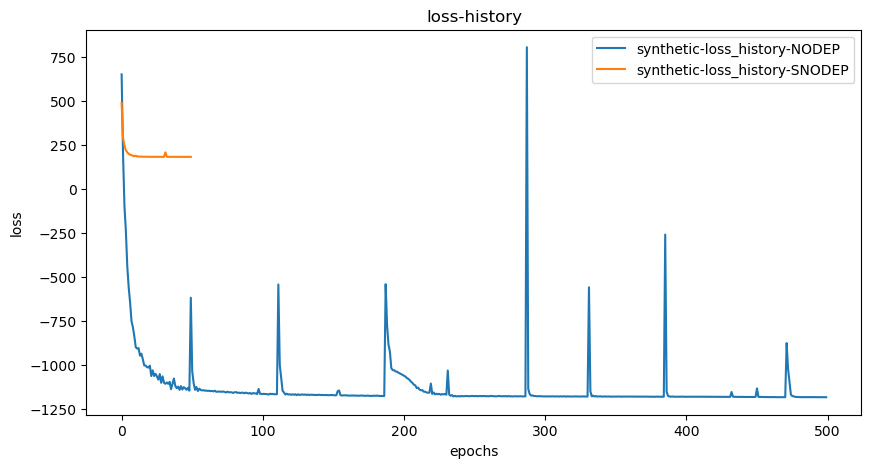

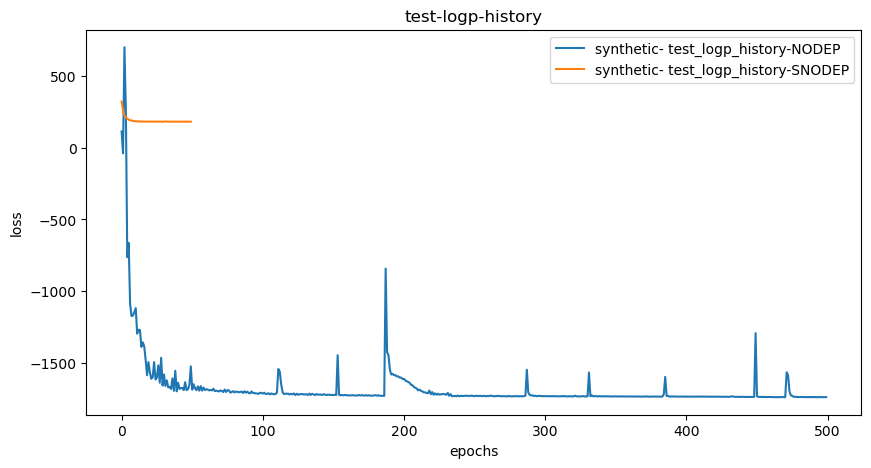

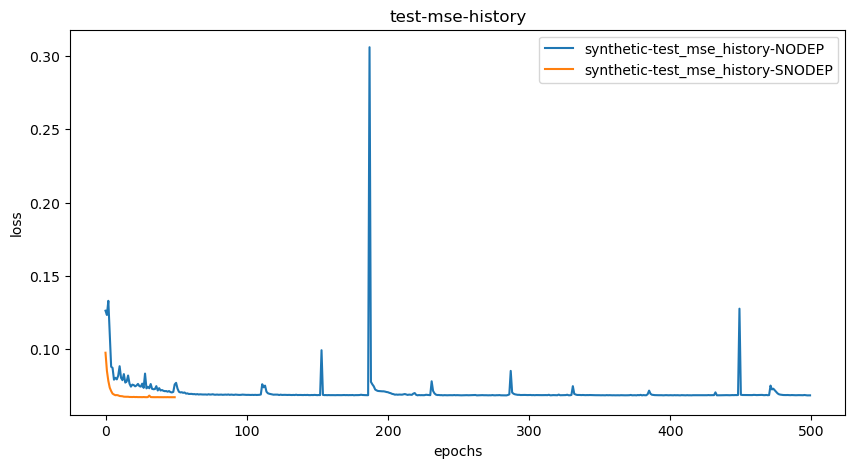

In [27]:
# plt.figure(figsize=(10, 5))
# # gene_expr
# plt.plot(loss_history_2, label='synthetic-loss_history-NODEP')
# plt.plot(loss_history_3, label='synthetic-loss_history-SNODEP')

# plt.title('loss-history')
# plt.xlabel('epochs')
# plt.ylabel('loss')
# plt.legend()
# plt.show()

# plt.figure(figsize=(10, 5))
# # gene_expr
# plt.plot(test_logp_history_2, label= 'synthetic- test_logp_history-NODEP')
# plt.plot(test_logp_history_3, label= 'synthetic- test_logp_history-SNODEP')

# plt.title('test-logp-history')
# plt.xlabel('epochs')
# plt.ylabel('loss')
# plt.legend()
# plt.show()

# plt.figure(figsize=(10, 5))
# # gene_expr
# plt.plot(test_mse_history_2, label= 'synthetic-test_mse_history-NODEP')
# plt.plot(test_mse_history_3, label= 'synthetic-test_mse_history-SNODEP')

# plt.title('test-mse-history')
# plt.xlabel('epochs')
# plt.ylabel('loss')
# plt.legend()
# plt.show()


MISC-something

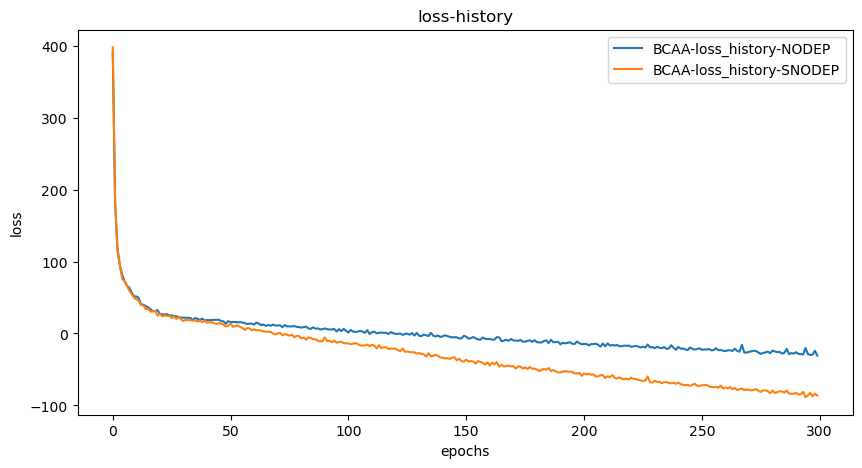

In [30]:
# plt.figure(figsize=(10, 5))
# # gene_expr
# # plt.plot(loss_history_2, label='BCAA-loss_history-NODEP')
# # plt.plot(loss_history_3, label='BCAA-loss_history-SNODEP')

# # flux_knockout_gene_added
# plt.plot(loss_history_4, label='BCAA-loss_history-NODEP')
# plt.plot(loss_history_5, label='BCAA-loss_history-SNODEP')

# plt.title('loss-history')
# plt.xlabel('epochs')
# plt.ylabel('loss')
# plt.legend()
# plt.show()

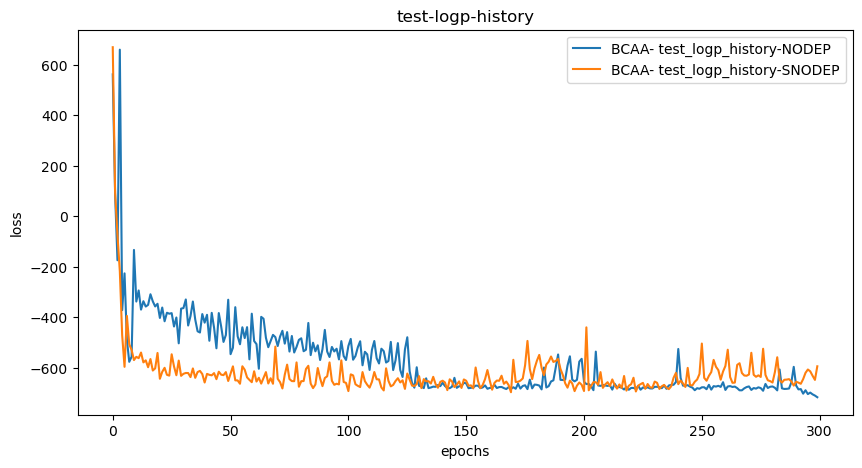

In [25]:
# plt.figure(figsize=(10, 5))
# # gene_expr
# # plt.plot(test_logp_history_2, label= 'BCAA- test_logp_history-NODEP')
# # plt.plot(test_logp_history_3, label= 'BCAA- test_logp_history-SNODEP')

# # flux_knockout_gene_added
# plt.plot(test_logp_history_4, label= 'BCAA- test_logp_history-NODEP')
# plt.plot(test_logp_history_5, label= 'BCAA- test_logp_history-SNODEP')

# plt.title('test-logp-history')
# plt.xlabel('epochs')
# plt.ylabel('loss')
# plt.legend()
# plt.show()

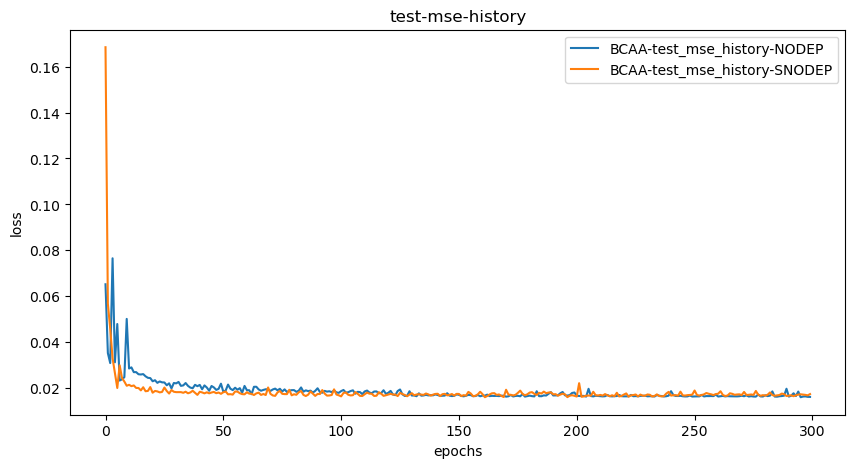

In [26]:
# plt.figure(figsize=(10, 5))
# # gene_expr
# # plt.plot(test_mse_history_2, label= 'BCAA-test_mse_history-NODEP')
# # plt.plot(test_mse_history_3, label= 'BCAA-test_mse_history-SNODEP')

# # flux_knockout_gene_added
# plt.plot(test_mse_history_4, label= 'BCAA-test_mse_history-NODEP')
# plt.plot(test_mse_history_5, label= 'BCAA-test_mse_history-SNODEP')
# plt.title('test-mse-history')
# plt.title('test-mse-history')
# plt.xlabel('epochs')
# plt.ylabel('loss')
# plt.legend()
plt.show()

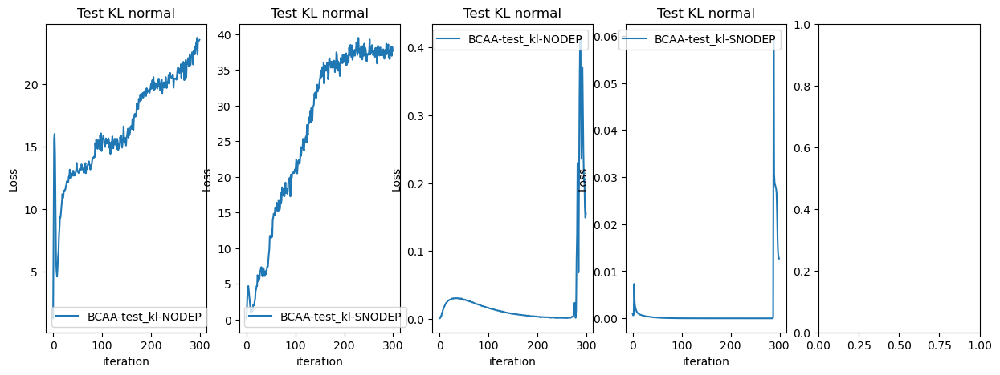

In [28]:
# # # Example visualization
# # # Let's assume the data is a 1D array or 2D matrix

# # Create a figure with two subplots side by side
# fig, axs = plt.subplots(1, 5, figsize=(15, 5))

# # gene_expr

# # Plot the first test KL divergence history on the first subplot
# axs[0].plot(test_kl_2.reshape(-1, 10).sum(axis=1), label='BCAA-test_kl-NODEP')
# axs[0].set_title('Test KL normal')
# axs[0].set_xlabel('iteration')
# axs[0].set_ylabel('Loss')
# axs[0].legend()

# # Plot the first test KL divergence history on the first subplot
# axs[1].plot(test_kl_3.reshape(-1, 10).sum(axis=1), label='BCAA-test_kl-SNODEP')
# axs[1].set_title('Test KL normal')
# axs[1].set_xlabel('iteration')
# axs[1].set_ylabel('Loss')
# axs[1].legend()

# # flux_knockout_gene_added
# # Plot the first test KL divergence history on the first subplot
# axs[2].plot(test_kl_4.reshape(-1, 10).sum(axis=1), label='BCAA-test_kl-NODEP')
# axs[2].set_title('Test KL normal')
# axs[2].set_xlabel('iteration')
# axs[2].set_ylabel('Loss')
# axs[2].legend()

# # Plot the first test KL divergence history on the first subplot
# axs[3].plot(test_kl_5.reshape(-1, 10).sum(axis=1), label='BCAA-test_kl-SNODEP')
# axs[3].set_title('Test KL normal')
# axs[3].set_xlabel('iteration')
# axs[3].set_ylabel('Loss')
# axs[3].legend()

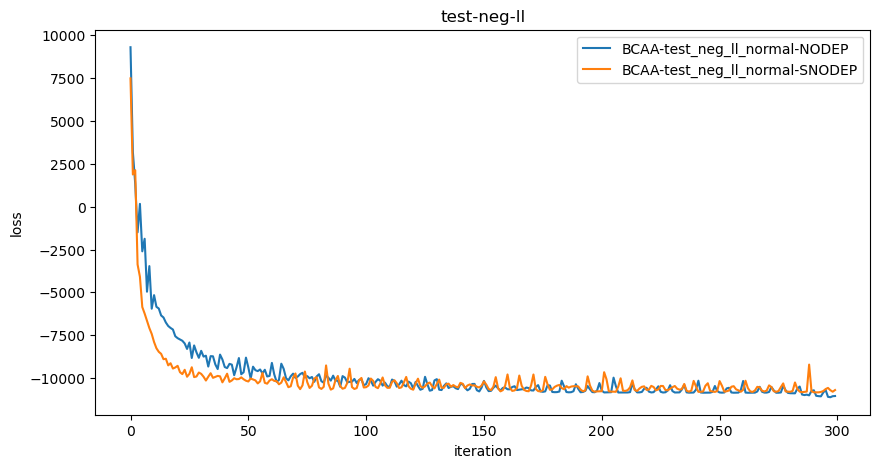

In [29]:
# plt.figure(figsize=(10, 5))

# # gene_expr
# # plt.plot(test_neg_ll_2.reshape(-1, 10).sum(axis=1), label= 'BCAA-test_neg_ll_normal-NODEP')
# # plt.plot(test_neg_ll_3.reshape(-1, 10).sum(axis=1), label= 'BCAA-test_neg_ll_normal-SNODEP')

# # flux_knockout_gene_added
# plt.plot(test_neg_ll_4.reshape(-1, 10).sum(axis=1), label= 'BCAA-test_neg_ll_normal-NODEP')
# plt.plot(test_neg_ll_5.reshape(-1, 10).sum(axis=1), label= 'BCAA-test_neg_ll_normal-SNODEP')


# plt.title('test-neg-ll')
# plt.xlabel('iteration')
# plt.ylabel('loss')
# plt.legend()
# plt.show()

In [8]:
# # Inspect the data
# print("Data shape:", training_time.shape)
# print("Data type:", type(training_time))
# print("Data example:", training_time[:5])

NameError: name 'training_time' is not defined

In [104]:
# # Inspect the data
# print("Data shape:", parameter_count.shape)
# print("Data type:", type(parameter_count))
# print("Data example:", parameter_count[:5])

Data shape: (1,)
Data type: <class 'numpy.ndarray'>
Data example: [135916]


## Figures for paper

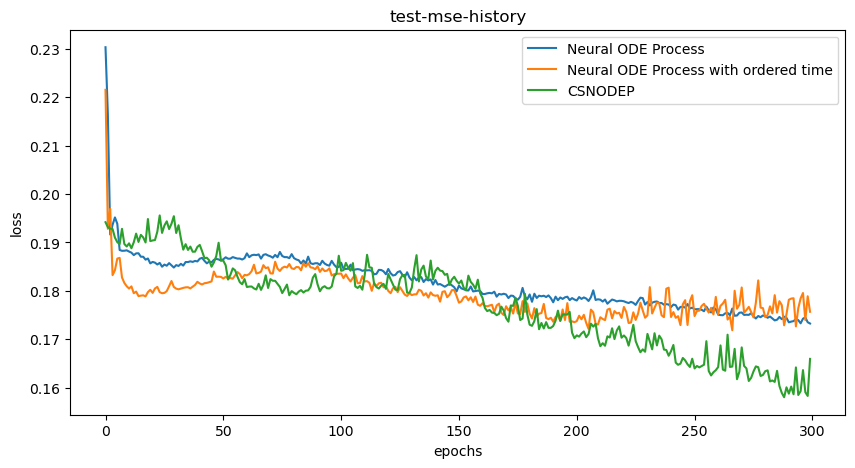

In [20]:
plt.figure(figsize=(10, 5))
plt.plot(test_mse_history_2, label= 'Neural ODE Process')
plt.plot(test_mse_history_9, label= 'Neural ODE Process with ordered time')
# plt.plot(test_mse_history_24, label= 'test_mse_history_mean_x_poisson_CDE_backward_LSTM_last_op')
plt.plot(test_mse_history_20, label= 'CSNODEP')
plt.title('test-mse-history')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

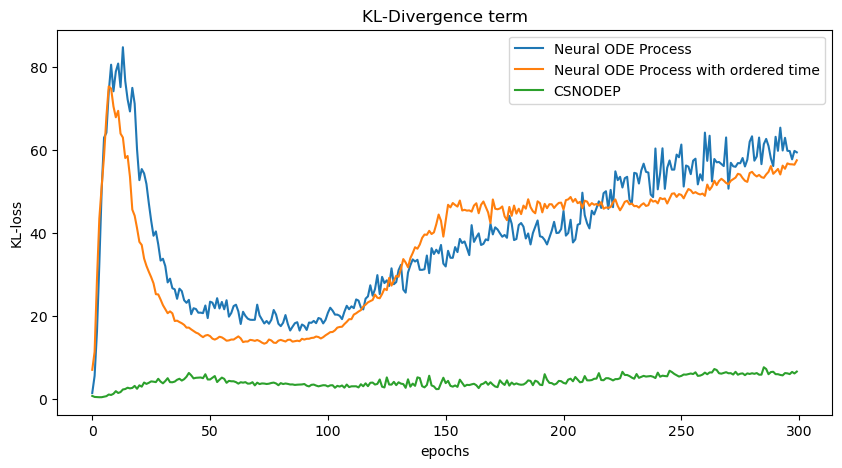

In [21]:
# # Example visualization
# # Let's assume the data is a 1D array or 2D matrix

# # Create a figure with two subplots side by side
# fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# # Plot the first test KL divergence history on the first subplot
# axs[0].plot(test_kl_2.reshape(-1, 10).sum(axis=1), label='Neural ODE Process')
# axs[0].set_title('Test KL normal')
# axs[0].set_xlabel('iteration')
# axs[0].set_ylabel('Loss')
# axs[0].legend()

# axs[1].plot(test_kl_9.reshape(-1, 10).sum(axis=1), label='Neural ODE Process with ordered time')
# axs[1].set_title('Test KL normal')
# axs[1].set_xlabel('iteration')
# axs[1].set_ylabel('Loss')
# axs[1].legend()


# axs[2].plot(test_kl_20.reshape(-1, 10).sum(axis=1), label='CSNODEP')
# axs[2].set_title('Test KL normal')
# axs[2].set_xlabel('iteration')
# axs[2].set_ylabel('Loss')
# axs[2].legend()

# plt.show()


plt.figure(figsize=(10, 5))
plt.plot(test_kl_2.reshape(-1, 10).sum(axis=1), label= 'Neural ODE Process')
plt.plot(test_kl_9.reshape(-1, 10).sum(axis=1), label= 'Neural ODE Process with ordered time')
# plt.plot(test_mse_history_24, label= 'test_mse_history_mean_x_poisson_CDE_backward_LSTM_last_op')
plt.plot(test_kl_20.reshape(-1, 10).sum(axis=1), label= 'CSNODEP')
plt.title('KL-Divergence term')
plt.xlabel('epochs')
plt.ylabel('KL-loss')
plt.legend()
plt.show()